In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk

In [360]:
df = pd.read_csv(r"C:\Users\Jieyi\Downloads\covid19_articles.csv")

In [361]:
df = df.drop(columns = "Unnamed: 0")

#### Preprocessing contents data

In [12]:
contents = df['content'].values

In [13]:
from string import punctuation
print(punctuation)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [14]:
all_contents = [''.join([c for c in i if c not in punctuation]) for i in contents]

In [15]:
all_contents = [i.lower() for i in all_contents]

In [17]:
from nltk.corpus import stopwords

In [18]:
sw = stopwords.words('english')
other_trash = ["news", "new", 'update', 'cnnpolitics', "reuters", 'could', 'may', "would", "also",
              "said"]
domain_names = list(df['domain'].values)
trash_tokens = sw + domain_names + other_trash

#### prerocess the content texts

In [19]:
all_contents[1].split()
content_list = list()
for i in all_contents:
    temp = i.split()
    content_list.append(" ".join([j for j in temp if j not in trash_tokens]))

In [315]:
len(content_list)

32826

In [100]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE

In [101]:
def vectorize(text, maxx_features):    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

### Four months together

In [319]:
X = vectorize(content_list, 2 ** 10)
X.shape

(32826, 1024)

In [320]:
pca = PCA(n_components=0.95, random_state=25)
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(32826, 855)

In [84]:
distortions = []
K = range(5, 15)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=25).fit(X_reduced)
    k_means.fit(X_reduced)
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

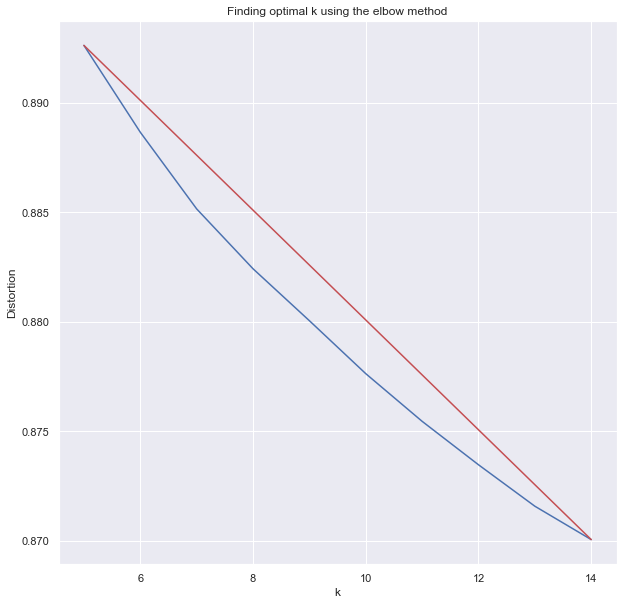

In [85]:
X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# plot elbow method
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Finding optimal k using the elbow method')
plt.show()

In [321]:
k = 8
kmeans = KMeans(n_clusters=k, random_state=25)
y_pred = kmeans.fit_predict(X_reduced)
df['y'] = y_pred

In [107]:
len(y_pred)

32826

In [327]:
tsne = TSNE(verbose=1, perplexity=100, random_state=25)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 32826 samples in 7.784s...
[t-SNE] Computed neighbors for 32826 samples in 1584.281s...
[t-SNE] Computed conditional probabilities for sample 1000 / 32826
[t-SNE] Computed conditional probabilities for sample 2000 / 32826
[t-SNE] Computed conditional probabilities for sample 3000 / 32826
[t-SNE] Computed conditional probabilities for sample 4000 / 32826
[t-SNE] Computed conditional probabilities for sample 5000 / 32826
[t-SNE] Computed conditional probabilities for sample 6000 / 32826
[t-SNE] Computed conditional probabilities for sample 7000 / 32826
[t-SNE] Computed conditional probabilities for sample 8000 / 32826
[t-SNE] Computed conditional probabilities for sample 9000 / 32826
[t-SNE] Computed conditional probabilities for sample 10000 / 32826
[t-SNE] Computed conditional probabilities for sample 11000 / 32826
[t-SNE] Computed conditional probabilities for sample 12000 / 32826
[t-SNE] Computed conditional probabilities for

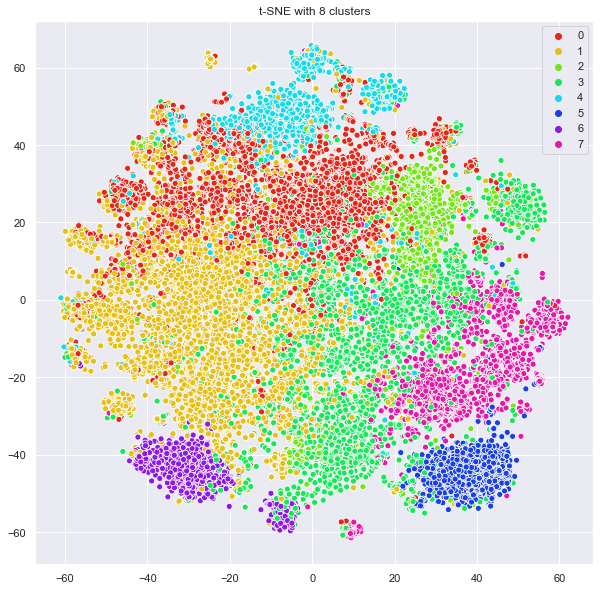

In [346]:
import seaborn as sns

sns.set(rc={'figure.figsize':(10,10)})
palette = sns.hls_palette(k, l=.5, s=.8)

sns.scatterplot(X_embedded_all[:,0], X_embedded_all[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with {} clusters'.format(k))
plt.show()

In [323]:
X_embedded_all = X_embedded
y_all = y_pred

### March

In [364]:
df['date'] = pd.to_datetime(df['date'])

In [365]:
df = df.reset_index(drop = True)

In [366]:
df[df['date'].dt.month == 3].index.values[0]

4596

In [367]:
df[df['date'].dt.month == 3].index.values[-1]

23608

In [368]:
df_3 = df.copy().iloc[4596:23609, ]
df_3

,title,date,author,domain,url,content,topic_area,y
4596,Global stocks fall as central bank reassurance...,2020-03-01,"Clare Duffy and Jill Disis, CNN Business",cnn,https://www.cnn.com/2020/03/01/investing/dow-f...,New York / Hong Kong (CNN Business) US stock f...,general,7
4597,Did Biden just stop the Sanders juggernaut? (o...,2020-03-01,Opinion by Jeff Yang,cnn,https://www.cnn.com/2020/02/29/opinions/joe-bi...,Jeff Yang is a frequent contributor to CNN Opi...,general,4
4598,'SNL' spoofs Mike Pence's new role leading cor...,2020-03-01,"Frank Pallotta, CNN Business",cnn,https://www.cnn.com/2020/03/01/media/snl-mike-...,"New York (CNN Business) ""Saturday Night Live"" ...",general,4
4599,Coronavirus casts a shadow over 2020 Summer Ol...,2020-03-01,"Steve Almasy, CNN",cnn,https://cnn.com/2020/03/01/sport/coronavirus-o...,(CNN) With less than four months until the ope...,general,0
4600,Shale Drillers Need A Miracle To Keep Producti...,2020-03-01,Irina Slav,oilprice,https://oilprice.com/Energy/Crude-Oil/Shale-Dr...,With West Texas Intermediate falling below $45...,business,5
...,...,...,...,...,...,...,...,...
23604,"Larry Hogan, Maryland governor, describes stay...",2020-03-31,"Chandelis Duster, CNN",cnn,https://www.cnn.com/2020/03/31/politics/larry-...,Washington (CNN) Maryland Gov. Larry Hogan on ...,general,4
23605,Trump expected to formally unveil new guidelin...,2020-03-31,"Kevin Liptak and Kaitlan Collins, CNN",cnn,https://www.cnn.com/2020/03/31/politics/trump-...,(CNN) The White House will formally reissue na...,general,4
23606,"Robert Weighton named world's oldest man, aged...",2020-03-31,"Lianne Kolirin, CNN",cnn,https://www.cnn.com/2020/03/31/europe/worlds-o...,(CNN) A British pensioner has just been the cr...,general,1
23607,Commander of aircraft carrier hit by coronavir...,2020-03-31,"Barbara Starr and Ryan Browne, CNN",cnn,https://www.cnn.com/2020/03/31/politics/aircra...,Washington (CNN) The commander of the USS Theo...,general,0


In [369]:
len(content_list_3)

19013

In [370]:
content_list_3 = content_list[4596:23609]

In [357]:
X_3 = vectorize(content_list_3, 2 ** 10)
X_3.shape

(19013, 1024)

In [371]:
pca = PCA(n_components=0.95, random_state=25)
X_3_reduced= pca.fit_transform(X_3.toarray())
X_3_reduced.shape

(19013, 841)

In [112]:
distortions_3 = []
K = range(5, 15)
for k in K:
    k_means_3 = KMeans(n_clusters=k, random_state=25).fit(X_3_reduced)
    k_means_3.fit(X_3_reduced)
    distortions_3.append(sum(np.min(cdist(X_3_reduced, k_means_3.cluster_centers_, 'euclidean'), axis=1)) / X_3.shape[0])

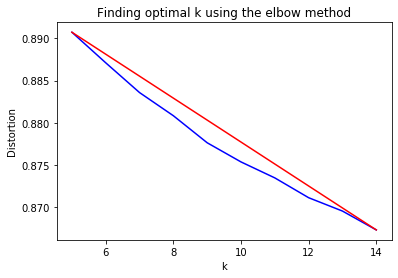

In [113]:
X_line = [K[0], K[-1]]
Y_line = [distortions_3[0], distortions_3[-1]]

# plot elbow method
plt.plot(K, distortions_3, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Finding optimal k using the elbow method')
plt.show()

In [372]:
k = 9
kmeans_3 = KMeans(n_clusters=k, random_state=25)
y_pred_3 = kmeans_3.fit_predict(X_3_reduced)
df_3['y'] = y_pred_3

In [378]:
X_3.toarray().shape

(19013, 1024)

In [383]:
tsne = TSNE(verbose=1, perplexity=100, random_state=25)
X_embedded_3 = tsne.fit_transform(X_3.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 19013 samples in 1.929s...
[t-SNE] Computed neighbors for 19013 samples in 523.434s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19013
[t-SNE] Computed conditional probabilities for sample 2000 / 19013
[t-SNE] Computed conditional probabilities for sample 3000 / 19013
[t-SNE] Computed conditional probabilities for sample 4000 / 19013
[t-SNE] Computed conditional probabilities for sample 5000 / 19013
[t-SNE] Computed conditional probabilities for sample 6000 / 19013
[t-SNE] Computed conditional probabilities for sample 7000 / 19013
[t-SNE] Computed conditional probabilities for sample 8000 / 19013
[t-SNE] Computed conditional probabilities for sample 9000 / 19013
[t-SNE] Computed conditional probabilities for sample 10000 / 19013
[t-SNE] Computed conditional probabilities for sample 11000 / 19013
[t-SNE] Computed conditional probabilities for sample 12000 / 19013
[t-SNE] Computed conditional probabilities for 

In [648]:
df_3["new_y"] = df_3["y3"].map(dict_3)

In [649]:
df_3.head()

,title,date,author,domain,url,content,topic_area,y,y3,new_y
4596,Global stocks fall as central bank reassurance...,2020-03-01,"Clare Duffy and Jill Disis, CNN Business",cnn,https://www.cnn.com/2020/03/01/investing/dow-f...,New York / Hong Kong (CNN Business) US stock f...,general,3,3,market & investments
4597,Did Biden just stop the Sanders juggernaut? (o...,2020-03-01,Opinion by Jeff Yang,cnn,https://www.cnn.com/2020/02/29/opinions/joe-bi...,Jeff Yang is a frequent contributor to CNN Opi...,general,4,4,government
4598,'SNL' spoofs Mike Pence's new role leading cor...,2020-03-01,"Frank Pallotta, CNN Business",cnn,https://www.cnn.com/2020/03/01/media/snl-mike-...,"New York (CNN Business) ""Saturday Night Live"" ...",general,4,4,government
4599,Coronavirus casts a shadow over 2020 Summer Ol...,2020-03-01,"Steve Almasy, CNN",cnn,https://cnn.com/2020/03/01/sport/coronavirus-o...,(CNN) With less than four months until the ope...,general,0,0,regional
4600,Shale Drillers Need A Miracle To Keep Producti...,2020-03-01,Irina Slav,oilprice,https://oilprice.com/Energy/Crude-Oil/Shale-Dr...,With West Texas Intermediate falling below $45...,business,8,8,oil


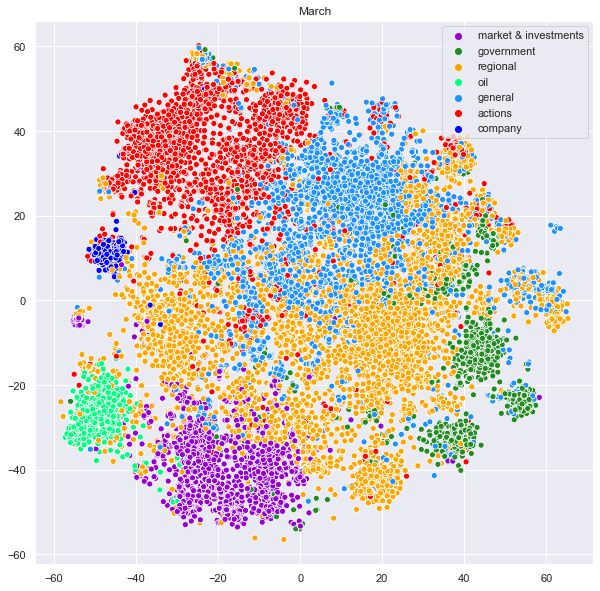

In [678]:
sns.set(rc={'figure.figsize':(10,10)})
k = 9

color_dict = dict({'market & investments':'darkviolet',
                  'government':'forestgreen',
                  'regional': 'orange',
                  'oil': 'springgreen',
                  'general': 'dodgerblue',
                  'actions': "red",
                  'company': 'blue'})

sns.scatterplot(X_embedded_3[:,0], X_embedded_3[:,1], hue=df_3['new_y'].values, legend='full', palette=color_dict)
plt.legend(loc='best')
plt.title('March')
plt.show()

In [647]:
dict_3  = {0:"regional", 1:"company", 2:"general", 3: "market & investments", 
 4:"government", 5:"actions", 6:"regional", 7:"actions", 8:"oil"}

In [437]:
dict_3

{0: 'business & company news',
 1: 'financial',
 2: 'general',
 3: 'market, investments & stocks',
 4: 'government',
 5: 'actions',
 6: 'regional',
 7: 'actions',
 8: 'oil'}

In [631]:
topics_3 = ["economy", "business", "general", "economy", "government", "actions", "international",
"business", "oil"]

### Apr

In [438]:
print(df[df['date'].dt.month == 4].index.values[0])
print(df[df['date'].dt.month == 4].index.values[-1])

23609
32825


In [440]:
df_4 = df.copy().iloc[23609:32826, ]

In [441]:
df_4

,title,date,author,domain,url,content,topic_area,y
23609,Stocks making the biggest moves in the premark...,2020-04-01,Peter Schacknow@peterschack,cnbc,https://www.cnbc.com/2020/04/01/stocks-making-...,Take a look at some of the biggest movers in t...,finance,3
23610,UPDATE 1-Wind turbine maker Nordex suspends pr...,2020-04-01,NaN,reuters,https://www.reuters.com/article/health-coronav...,"(Adds details on production, context) FRANKFUR...",business,3
23611,Russia's atomic agency reports four coronaviru...,2020-04-01,NaN,reuters,https://www.reuters.com/article/health-coronav...,"MOSCOW, April 1 (Reuters) - Russia’s state nuc...",business,0
23612,UPDATE 1-India's March electricity usage falls...,2020-04-01,Sudarshan Varadhan,reuters,https://www.reuters.com/article/india-electric...,(Adds details on lockdown) By Sudarshan Varadh...,business,3
23613,Analysts cut Asian firms' 2020 profit forecast...,2020-04-01,NaN,reuters,https://www.reuters.com/article/asia-results/a...,April 1 (Reuters) - Analysts are cutting Asian...,business,3
...,...,...,...,...,...,...,...,...
32821,RBN Energy: Coronavirus harms the oil market m...,2020-04-21,Tyler Clifford@_TylerTheTyler_,cnbc,https://www.cnbc.com/2020/04/20/rbn-energy-cor...,The coronavirus pandemic is weighing more on t...,finance,5
32822,"Forex markets: Oil, coronavirus pandemic in focus",2020-04-21,NaN,cnbc,https://www.cnbc.com/2020/04/21/forex-markets-...,The dollar gave up some gains against the curr...,finance,7
32823,Coronavirus live updates: China reports 11 new...,2020-04-21,Huileng Tan@huileng_tan,cnbc,https://www.cnbc.com/2020/04/21/coronavirus-li...,This is CNBC's live blog covering all the late...,finance,0
32824,Brazil's Bolsonaro says hopes coronavirus quar...,2020-04-21,NaN,reuters,https://www.reuters.com/article/us-health-coro...,SAO PAULO/RIO DE JANEIRO (Reuters) - Brazilian...,business,0


In [442]:
content_list_4 = content_list[23609:32826]

In [443]:
X_4 = vectorize(content_list_4, 2 ** 10)
X_4.shape

(9217, 1024)

In [444]:
pca = PCA(n_components=0.95, random_state=25)
X_4_reduced= pca.fit_transform(X_4.toarray())
X_4_reduced.shape

(9217, 826)

In [201]:
distortions_4 = []
K = range(5, 15)
for k in K:
    k_means_4 = KMeans(n_clusters=k, random_state=25).fit(X_4_reduced)
    k_means_4.fit(X_4_reduced)
    distortions_4.append(sum(np.min(cdist(X_4_reduced, k_means_4.cluster_centers_, 'euclidean'), axis=1)) / X_4.shape[0])

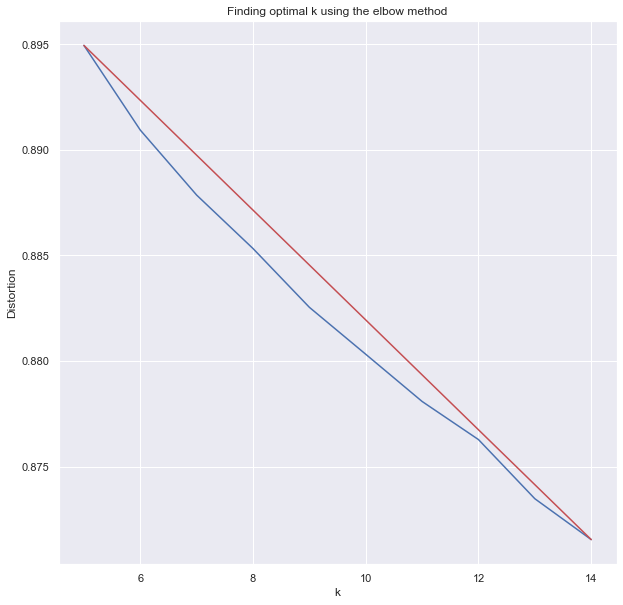

In [202]:
X_line = [K[0], K[-1]]
Y_line = [distortions_4[0], distortions_4[-1]]

# plot elbow method
plt.plot(K, distortions_4, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Finding optimal k using the elbow method')
plt.show()

In [477]:
k = 9
kmeans_4 = KMeans(n_clusters=k, random_state=25)
y_pred_4 = kmeans_4.fit_predict(X_4_reduced)
df_4['y'] = y_pred_4

In [465]:
tsne = TSNE(verbose=1, perplexity=100, random_state=25)
X_embedded_4 = tsne.fit_transform(X_4.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 9217 samples in 0.930s...
[t-SNE] Computed neighbors for 9217 samples in 119.154s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9217
[t-SNE] Computed conditional probabilities for sample 2000 / 9217
[t-SNE] Computed conditional probabilities for sample 3000 / 9217
[t-SNE] Computed conditional probabilities for sample 4000 / 9217
[t-SNE] Computed conditional probabilities for sample 5000 / 9217
[t-SNE] Computed conditional probabilities for sample 6000 / 9217
[t-SNE] Computed conditional probabilities for sample 7000 / 9217
[t-SNE] Computed conditional probabilities for sample 8000 / 9217
[t-SNE] Computed conditional probabilities for sample 9000 / 9217
[t-SNE] Computed conditional probabilities for sample 9217 / 9217
[t-SNE] Mean sigma: 0.339719
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.324158
[t-SNE] KL divergence after 1000 iterations: 1.749443


In [242]:
df_embedded_4 = pd.DataFrame({"x1":X_embedded_4[:, 0], "x2": X_embedded_4[:, 1], "y": y_pred_4})
c1 = df_embedded_4.groupby("y").agg("mean")["x1"].values
c2 = df_embedded_4.groupby("y").agg("mean")["x2"].values

array([ 27.615837  , -25.434088  ,   0.99284214,  25.711514  ,
         6.401461  ,   9.085561  ,   5.07994   , -19.417204  ,
        -7.406351  ], dtype=float32)

In [522]:
df_4["new_y"] = df_4["y"].map(dict_4)

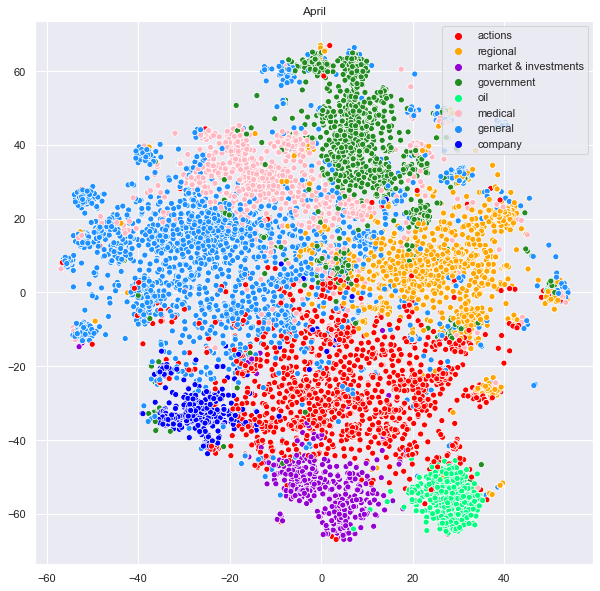

In [677]:
sns.set(rc={'figure.figsize':(10,10)})
k = 9

color_dict = dict({'market & investments':'darkviolet',
                  'government':'forestgreen',
                  'regional': 'orange',
                  'oil': 'springgreen',
                  'general': 'dodgerblue',
                  'actions': "red",
                  'company': 'blue',
                  'medical': "lightpink"})

# plot
sns.scatterplot(X_embedded_4[:,0], X_embedded_4[:,1], hue=df_4["new_y"].values, legend='full', palette=color_dict)
plt.title('April')
plt.legend(loc = "upper right")
plt.show()

In [521]:
dict_4 = {0:"oil", 1:"company", 2:"market & investments", 3:"regional", 4:"government", 5:"government",
6:"actions", 7:"general", 8:"medical"}

In [618]:
topics_4 = ["oil", "economy", "economy", "international", "government", "government", "actions",
"general", "medical"]

In [248]:
print(df[df['date'].dt.month == 1].index.values[0])
print(df[df['date'].dt.month == 1].index.values[-1])

0
877


### Combine Jan and Feb together

In [529]:
df_12 = df.copy().iloc[0:4596, :]

In [530]:
content_list_12 = content_list[0:4596]

In [531]:
X_12 = vectorize(content_list_12, 2 ** 10)
X_12.shape

(4596, 1024)

In [532]:
pca = PCA(n_components=0.95, random_state=25)
X_12_reduced= pca.fit_transform(X_12.toarray())
X_12_reduced.shape

(4596, 764)

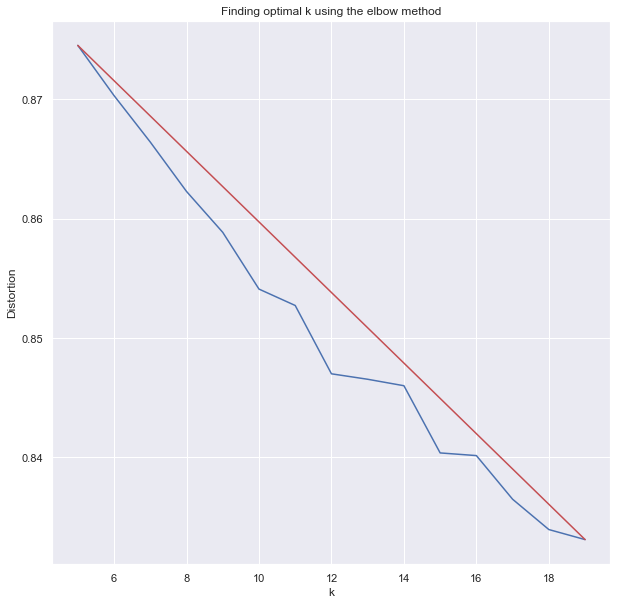

In [359]:
distortions_12 = []
K = range(5, 20)
for k in K:
    k_means_12 = KMeans(n_clusters=k, random_state=25).fit(X_12_reduced)
    k_means_12.fit(X_12_reduced)
    distortions_12.append(sum(np.min(cdist(X_12_reduced, k_means_12.cluster_centers_, 'euclidean'), axis=1)) / X_12.shape[0])
X_line = [K[0], K[-1]]
Y_line = [distortions_12[0], distortions_12[-1]]

# plot elbow method
plt.plot(K, distortions_12, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Finding optimal k using the elbow method')
plt.show()

In [533]:
k = 12
kmeans_12 = KMeans(n_clusters=k, random_state=25)
y_pred_12 = kmeans_12.fit_predict(X_12_reduced)
df_12['y'] = y_pred_12

In [534]:
tsne = TSNE(verbose=1, perplexity=100, random_state=25)
X_embedded_12 = tsne.fit_transform(X_12.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 4596 samples in 0.296s...
[t-SNE] Computed neighbors for 4596 samples in 29.597s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4596
[t-SNE] Computed conditional probabilities for sample 2000 / 4596
[t-SNE] Computed conditional probabilities for sample 3000 / 4596
[t-SNE] Computed conditional probabilities for sample 4000 / 4596
[t-SNE] Computed conditional probabilities for sample 4596 / 4596
[t-SNE] Mean sigma: 0.353284
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.971199
[t-SNE] KL divergence after 1000 iterations: 1.294836


In [540]:
X_embedded_12_new = X_embedded_12[df_12["y"]!=0]

In [566]:
df_12_new["y"] = df_12["y"].map(dict_12)

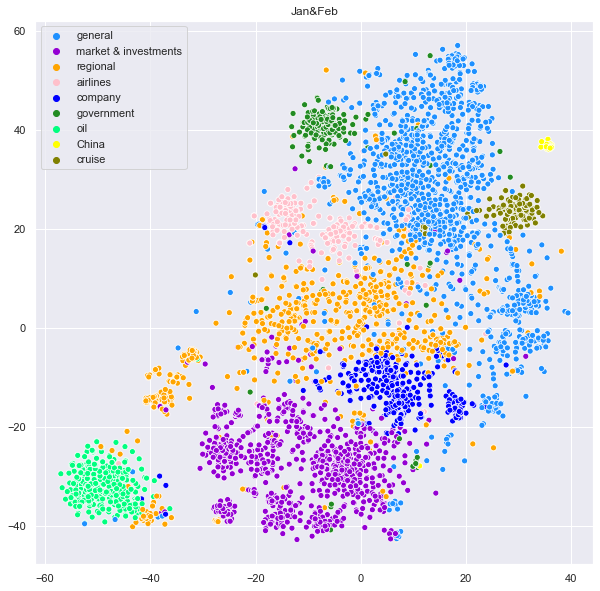

In [676]:
sns.set(rc={'figure.figsize':(10,10)})

color_dict = dict({'market & investments':'darkviolet',
                  'government':'forestgreen',
                  'regional': 'orange',
                  'oil': 'springgreen',
                  'general': 'dodgerblue',
                  'actions': "red",
                  'company': 'blue',
                  'medical': "lightpink",
                  'cruise': 'olive',
                  "China" : "yellow",
                  "airlines": 'pink'})

sns.scatterplot(X_embedded_12_new[:,0], X_embedded_12_new[:,1], hue=df_12_new["y"].values, legend='full', palette=color_dict)
plt.title("Jan&Feb")
plt.show()

In [537]:
df_12_new = df_12.copy()[df_12["y"]!=0]

In [ ]:
df_12 = df_12_new.copy()

In [563]:
dict_12 = dict(zip(range(1,12), ["market & investments", "government", "general","company", "regional", "cruise", "oil", "airlines", "market & investments",
"general", "China"]))

In [564]:
dict_12

{1: 'market & investments',
 2: 'government',
 3: 'general',
 4: 'company',
 5: 'regional',
 6: 'cruise',
 7: 'oil',
 8: 'airlines',
 9: 'market & investments',
 10: 'general',
 11: 'China'}

In [548]:
topics_12 = ["stock", "government", "general", "economy", "business", "international", "oil", 
 "airlines", "economy", "international", "international"]

### plot

In [620]:
dict_3 = dict(zip(range(0,9), topics_3))
dict_4 = dict(zip(range(0,9), topics_4))
dict_12 = dict(zip(range(1,12), topics_12))

In [621]:
len(X_embedded_12[:, 0])

4596

In [632]:
df_3["topics"] = df_3["y"].map(dict_3)
df_4["topics"] = df_4["y"].map(dict_4)
df_12["topics"] = df_12["y"].map(dict_12)

C:\Users\Jieyi\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Jieyi\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [633]:
X1_new = X_embedded_12[y_pred_12!=0,0].tolist() + [100, 100, 100] + X_embedded_3[:,0].tolist() + X_embedded_4[:,0].tolist()
X2_new = X_embedded_12[y_pred_12!=0,1].tolist() + [100, 100, 100] + X_embedded_3[:,1].tolist() + X_embedded_4[:,1].tolist()

In [634]:
titles_new = df_12["title"].tolist() + ["dummy actions", "dummy medical", 
                                        "dummy general"] + df_3["title"].tolist() + df_4["title"].tolist()

In [635]:
ls_month = ["Jan&Feb"]*(sum(y_pred_12!=0) + 3) + ["Mar"]*(len(y_pred_3)) + ["Apr"]*(len(y_pred_4))

In [636]:
Y_new = df_12["topics"].values.tolist() + ["actions", "medical", 
                                           "general"] + df_3["topics"].values.tolist() + df_4["topics"].values.tolist()

In [651]:
titles_new = ["dummy actions", "dummy medical"] + df_12["title"].tolist() +df_3["title"].tolist() + df_4["title"].tolist()

In [652]:
ls_month = ["Jan&Feb"]*(sum(y_pred_12!=0) + 2) + ["Mar"]*(len(y_pred_3)) + ["Apr"]*(len(y_pred_4))

In [653]:
X1_new = [100, 100] + X_embedded_12_new[:,0].tolist() + X_embedded_3[:,0].tolist() + X_embedded_4[:,0].tolist()
X2_new = [100, 100] + X_embedded_12_new[:,1].tolist() + X_embedded_3[:,1].tolist() + X_embedded_4[:,1].tolist()

In [654]:
Y_new = ["actions", "medical"] + df_12["y"].values.tolist() + df_3["new_y"].values.tolist() + df_4["new_y"].values.tolist()

In [655]:
df_final = pd.DataFrame({"X1":X1_new, "X2":X2_new, "Y":Y_new, "month":ls_month, "title" : titles_new})

In [656]:
df_final

,X1,X2,Y,month,title
0,100.000000,100.000000,actions,Jan&Feb,dummy actions
1,100.000000,100.000000,medical,Jan&Feb,dummy medical
2,7.343667,30.613369,general,Jan&Feb,"China pneumonia outbreak: It's not SARS, so wh..."
3,16.963600,46.163208,general,Jan&Feb,New virus identified as likely cause of myster...
4,7.289595,30.614574,general,Jan&Feb,"New SARS related virus, Wuhan pneumonia, ideni..."
...,...,...,...,...,...
32764,19.806799,-54.198074,oil,Apr,RBN Energy: Coronavirus harms the oil market m...
32765,5.325446,-63.204239,market & investments,Apr,"Forex markets: Oil, coronavirus pandemic in focus"
32766,19.574354,7.324414,regional,Apr,Coronavirus live updates: China reports 11 new...
32767,25.441595,17.316523,regional,Apr,Brazil's Bolsonaro says hopes coronavirus quar...


In [657]:
df_final_2 = df_final[df_final["Y"] != "cruise"]

In [658]:
import plotly.express as px

In [659]:
fig = px.scatter(df_final_2, x="X1", y="X2", animation_frame="month",
           color="Y", hover_name="Y", hover_data = ["title"],
        range_x=[-60,60], range_y=[-80,80])

fig["layout"].pop("updatemenus")

fig.show()

In [606]:
import plotly

In [660]:
plotly.offline.plot(fig, filename = "topics3.html")

'topics3.html'

reference:
https://www.kaggle.com/jannalipenkova/covid-19-media-overview
https://www.kaggle.com/maksimeren/covid-19-literature-clustering

#### Co-existing words

In [114]:
import datetime
from datetime import timedelta 
from heapq import nlargest
import collections
from collections import Counter

In [314]:
df.head()

,index,title,date,author,domain,url,content,topic_area,clean_content
0,0,"China pneumonia outbreak: It's not SARS, so wh...",2020-01-06,"Nectar Gan, CNN",cnn,https://www.cnn.com/2020/01/06/health/china-pn...,(CNN) Chinese health authorities have not been...,general,chinese health authorities able identify myste...
1,1,New virus identified as likely cause of myster...,2020-01-08,nature,nature,https://www.nature.com/articles/d41586-020-000...,Passengers arriving at Hong Kong's internation...,science,passengers arriving hong kongs international a...
2,3,"New SARS related virus, Wuhan pneumonia, ideni...",2020-01-09,"Nectar Gan, CNN",cnn,https://www.cnn.com/2020/01/08/health/china-wu...,(CNN) A mysterious pneumonia outbreak that has...,general,mysterious pneumonia outbreak struck dozens pe...
3,5,Mystery virus found in Wuhan resembles bat vir...,2020-01-10,\nDennis Normile\n,sciencemag,https://www.sciencemag.org/news/2020/01/myster...,"“Plenty of people are working on the outbreak,...",science,“plenty people working outbreak” says xu jiang...
4,7,Chinese researchers reveal draft genome of vir...,2020-01-11,\nJon Cohen\n,sciencemag,https://www.sciencemag.org/news/2020/01/chines...,"A seafoofd market in Wuhan, China has been con...",science,seafoofd market wuhan china considered likely ...


In [27]:
df["clean_content"] = content_list

In [92]:
def coexisting_word_plot(df, keyword, n, del_ls):
    df_temp = df[np.array([keyword in i for i in content_list])]
    key_content = df_temp["clean_content"]
    key_tokens = " ".join(key_content)
    key_tokens = key_tokens.split()
    freq_key = nltk.FreqDist(key_tokens)
    
    freq_key_dict = {} 
    test_values = list(freq_key.values())
    for key in list(freq_key.keys()): 
        for value in test_values: 
            freq_key_dict[key] = value 
            test_values.remove(value) 
            break
            
    for i in del_ls:
        del freq_key_dict[i]
        
    key_top_tokens = nlargest(n, freq_key_dict, key = freq_key_dict.get) 
    
    df_temp["date"] = pd.to_datetime(df_temp["date"])
    df_temp = df_temp.reset_index(drop = True)
    time_points_index = [0]
    for i in time_points[:7]:
        time_points_index.append(df_temp[df_temp['date']==i].index[0])
    time_points_index.append(df_temp.shape[0])
    
        
    df_token_trend = pd.DataFrame({'date':['01-08 ~ 01-21', '01-22 ~ 02-05', '02-06 ~ 02-19', '02-20 ~ 03-04', 
                      '03-05 ~ 03-18', '03-19 ~ 04-01', '04-02 ~ 04-15', '04-16 ~ 04-21']})
    
    for t in key_top_tokens:
        token_count = []
        token_percentage = []
        for i in range(8):
            ls_temp = key_content[time_points_index[i]:time_points_index[i+1]]
            count_temp = sum([t in j for j in ls_temp])
            token_count.append(count_temp)
            token_percentage.append(count_temp/(time_points_index[i+1] - time_points_index[i]))
        df_token_trend[t] = token_percentage
    
    plt.figure(figsize = (12,6))
    palette = plt.get_cmap('Set1')
 
    # multiple line plot
    num=0
    for column in df_token_trend.drop('date', axis=1):
        num+=1
        plt.plot(df_token_trend['date'], df_token_trend[column], marker='', 
                 color=palette(num), linewidth=1, alpha=0.9, label=column)
    
    plt.legend(loc=2, ncol=2)
 
    # titles
    plt.title("top word trend plot", loc='left', fontsize=12, fontweight=0, color='orange')
    plt.xlabel("Time")
    plt.ylabel("Percentage")

C:\Users\Jieyi\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


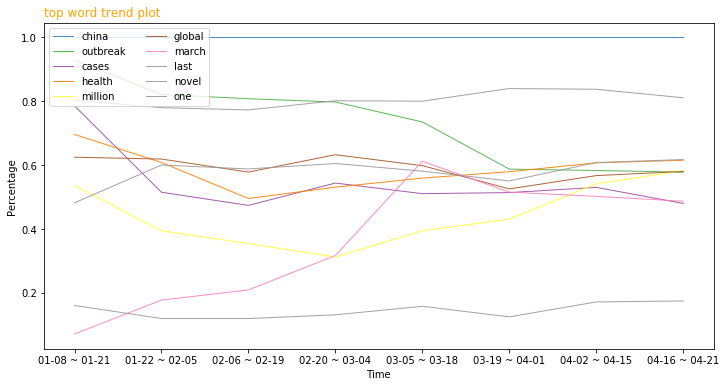

In [97]:
coexisting_word_plot(df, "china", 10, ["also", "said", "would","virus", "coronavirus", "us", "people", "year"])

C:\Users\Jieyi\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


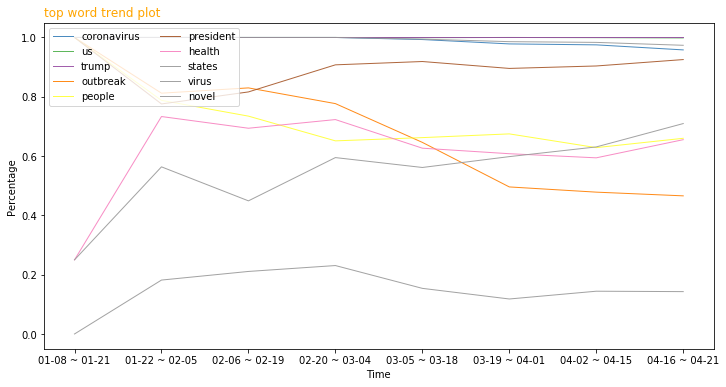

In [99]:
coexisting_word_plot(df, "trump", 10, ["also", "said", "would"])

C:\Users\Jieyi\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


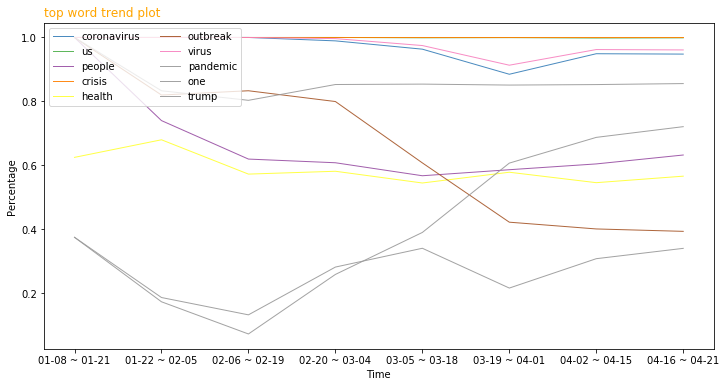

In [115]:
coexisting_word_plot(df, "crisis", 10, ["also", "said", "would"])

### I vs We

In [216]:
df_us = pd.read_csv(r"C:\Users\Jieyi\Downloads\covid19_articles.csv")

In [218]:
df_us['date'] = pd.to_datetime(df_us["date"])

In [219]:
df_us["content"] = [i.lower() for i in df_us["content"]]

In [220]:
i_count = [i.count("i") for i in df_us["content"]]

In [221]:
we_count = [i.count("we") for i in df_us["content"]]

In [222]:
me_count = [i.count("me") for i in df_us["content"]]

In [223]:
us_count = [i.count("us") for i in df_us["content"]]

In [224]:
word_count = [len(i.split()) for i in df_us["content"]]

In [225]:
df_us["i_count"] = i_count
df_us["we_count"] = we_count
df_us["me_count"] = me_count
df_us["us_count"] = us_count
df_us["word_count"] = word_count

In [257]:
df_count["i_freq"] = df_count['i_count']/df_count["word_count"]

In [258]:
df_count['i_z'] = (df_count['i_freq'] - np.mean(df_count["i_freq"].values))/np.std(df_count["i_freq"].values)

In [235]:
np.std(i_count)

201.80816390152486

In [238]:
i_z = (i_count - np.mean(i_count))/np.std(i_count)
we_z = (we_count - np.mean(we_count))/np.std(we_count)
me_z = (me_count - np.mean(me_count))/np.std(me_count)
us_z = (us_count - np.mean(us_count))/np.std(us_count)

In [252]:
df_us["i_z"] = i_z
df_us["we_z"] = we_z
df_us["us_z"] = us_z
df_count_2 = df_us.groupby("date").agg({'i_z': 'mean', 'we_z':"mean", 'us_z':'mean'})

In [313]:
df_count.to_csv(r"C:\Users\Jieyi\Downloads\us_count.csv")

In [280]:
df_count['i_z_2'] = (df_count["i_freq"] - np.mean(df_count["i_freq"].values))/np.std(df_count["i_freq"].values)
df_count['we_z_2'] = (df_count["we_freq"] - np.mean(df_count["we_freq"].values))/np.std(df_count["we_freq"].values)

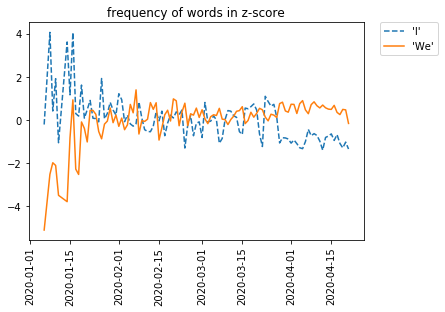

In [312]:
plt.plot(df_count.index.values, df_count["i_z_2"], "--", label = "'I'")
plt.plot(df_count.index.values, df_count["we_z_2"], label = "'We'")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title("frequency of words in z-score")
plt.show()